# Imports and Variables

In [8]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
from time import time
from skimage.morphology import skeletonize

# Helper Functions

In [9]:
def read_img(img_path, grayscale=False):
    if grayscale:
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    else:
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = np.int32(img)
    return img

# Q1 Let's get Blurry

In [10]:
# Given an image array and a kernel, this function returns the convolved image
def conv2D(img, kernel):
    # Get the dimensions of the kernel
    if callable(kernel): # If statistical filter or bilateral filter then a function would be passed
        kernel_height = kernel_width = kernel(return_k=True)
    else:
        kernel_height, kernel_width = kernel.shape
    padding_height, padding_width = kernel_height // 2, kernel_width // 2
    # Add zero padding to the input image
    if len(img.shape) == 3:
        padded_image = np.pad(img, ((padding_height, padding_height), (padding_width, padding_width), (0, 0)), mode='constant', constant_values=0)
    else:
        padded_image = np.pad(img, ((padding_height, padding_height), (padding_width, padding_width)), mode='constant', constant_values=0)
    
    if len(img.shape) == 3:
        convolved_img = np.zeros_like(img)
        for i in range(img.shape[0]):
            for j in range(img.shape[1]):
                for k in range(img.shape[2]):
                    if callable(kernel):
                        convolved_img[i, j, k] = kernel(padded_image[i:i+kernel_height, j:j+kernel_width, k])
                    else:
                        convolved_img[i, j, k] = np.sum(padded_image[i:i+kernel_height, j:j+kernel_width, k] * kernel, axis=(0, 1))
    else:
        convolved_img = np.zeros_like(img)
        for i in range(img.shape[0]):
            for j in range(img.shape[1]):
                if callable(kernel):
                    convolved_img[i, j] = kernel(padded_image[i:i+kernel_height, j:j+kernel_width])
                else:
                    convolved_img[i, j] = np.sum(padded_image[i:i+kernel_height, j:j+kernel_width] * kernel)
    return convolved_img

# Averaging Filter
def meanFilter(img, k=5):
    #                       [[1 1 1]
    # 3x3 Mean Filter: 1/9 * [1 1 1]
    #                        [1 1 1]]
    kernel = np.ones((k, k)) / (k * k)
    return conv2D(img, kernel)

# Statistic Filter
def medianFilter(img, k=5):
    # Always define the funtion to return the value of k as well
    def median(pixels=None, return_k=False):
        if return_k:
            return k
        return np.median(pixels)
    return conv2D(img, median)

# Fast Mean Filter which uses integral image
def fastMeanFilter(img, k=5):
    # Compute the integral image
    integral = np.cumsum(np.cumsum(img, axis=0), axis=1)
    filtered_img = np.zeros_like(img)

    padding_height, padding_width = k // 2, k // 2
    padded_integral = np.pad(integral, ((padding_height, padding_height), (padding_width, padding_width), (0, 0)), mode='constant', constant_values=0)

    for row_idx in range(img.shape[0]):
        for col_idx in range(img.shape[1]):
            for channel_idx in range(img.shape[2]):
                start_row_idx, start_col_idx = row_idx - k // 2, col_idx - k // 2
                end_row_idx, end_col_idx = row_idx + k // 2, col_idx + k // 2

                y1, x1 = max(0, start_row_idx) - 1, max(0, start_col_idx) - 1
                y2, x2 = min(img.shape[0] - 1, end_row_idx), min(img.shape[1] - 1, end_col_idx)
                
                window_sum = (padded_integral[y2, x2, channel_idx] - padded_integral[y1, x2, channel_idx] - padded_integral[y2, x1, channel_idx] + padded_integral[y1, x1, channel_idx])
                filtered_img[start_row_idx, start_col_idx, channel_idx] = window_sum / (k * k)

    return filtered_img

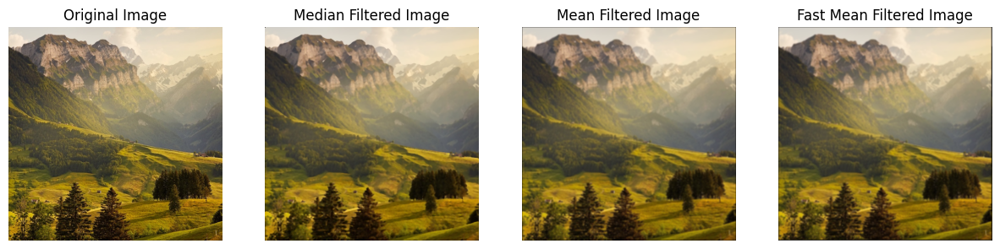

In [11]:
# Applying mean and median filter to IMG1.jpg
img1 = read_img('../images/IMG1.jpg')
avg_img = meanFilter(img1, 5)
median_img = medianFilter(img1, 5)
fast_avg_img = fastMeanFilter(img1, 5)
plt.figure(figsize=(15, 5))
plt.subplot(141)
plt.imshow(img1)
plt.axis('off')
plt.title('Original Image')
plt.subplot(142)
plt.imshow(median_img)
plt.axis('off')
plt.title('Median Filtered Image')
plt.subplot(143)
plt.imshow(avg_img)
plt.axis('off')
plt.title('Mean Filtered Image')
plt.subplot(144)
plt.imshow(fast_avg_img)
plt.axis('off')
plt.title('Fast Mean Filtered Image')
plt.show()

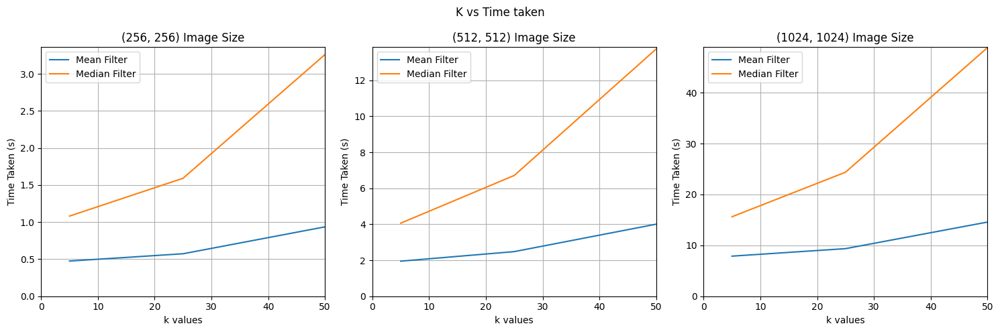

In [12]:
# Measuring times for different image sizes
img_sizes = [(256, 256), (512, 512), (1024, 1024)]
resized_imgs = list()

for img_size in img_sizes:
    # Resize only works with uint8 images and the read_img function returns images in int32 format
    img = np.int32(cv2.resize(np.uint8(img1), img_size))
    resized_imgs.append(img)

k_values = [5, 25, 50]

mean_filter_timings = list()
median_filter_timings = list()

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

for idx, img in enumerate(resized_imgs):
    mean_filter_timings.append(list())
    median_filter_timings.append(list())

    for k in k_values:
        start_time = time()
        avg_img = meanFilter(img, k)
        mean_filter_timings[idx].append(time() - start_time)
        
        start_time = time()
        median_img = medianFilter(img, k)
        median_filter_timings[idx].append(time() - start_time)

    axes[idx].plot(k_values, mean_filter_timings[idx], label='Mean Filter')
    axes[idx].plot(k_values, median_filter_timings[idx], label='Median Filter')
    axes[idx].set_xlabel('k values')
    axes[idx].set_ylabel('Time Taken (s)')
    axes[idx].set_ylim(0, max(median_filter_timings[idx]) + 0.1) # Taking max of median filter since we know median filter will be the slowest
    axes[idx].set_xlim(0, max(k_values))
    axes[idx].set_title(f'{img_sizes[idx]} Image Size')
    axes[idx].grid(True)
    axes[idx].legend()

plt.suptitle("K vs Time taken")
plt.tight_layout()
plt.show()

> The time complexity of the mean filter is lower than that of the median filter. This is because the mean filter is essentially a box filter, where each pixel is updated by multiplying neighboring pixel values with a constant kernel value ($\frac{1}{k^2}$) and summing them up. In contrast, the median filter determines each pixel's value based on the neighboring pixels by sorting or ordering them, which requires more computation. As a result, the median filter is slower than the mean filter due to the extra processing involved. Since the kernel is constant for a given k in mean filter thus the value of k does not affect the overall time taken to apply the filter for mean filter whereas on the other hand median filter highly depend on the size of the kernel as well as size of the image and hence the trend can be seen in the graphs.

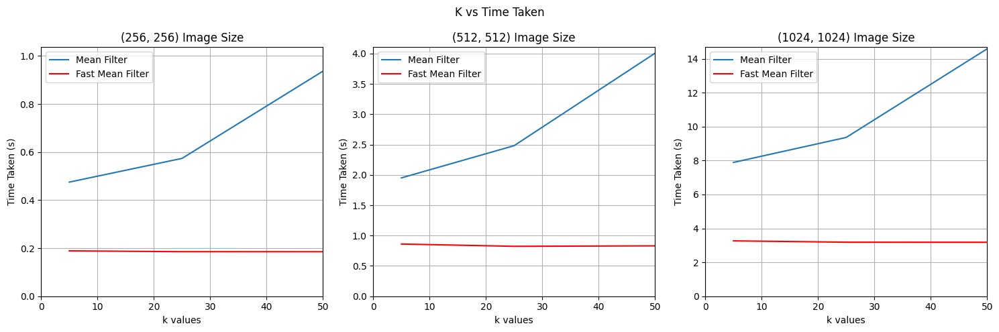

In [13]:
fast_mean_filter_timings = list()

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

for idx, img in enumerate(resized_imgs):
    fast_mean_filter_timings.append(list())
    for k in k_values:
        start_time = time()
        fast_mean_filtered_img = fastMeanFilter(img, k)
        fast_mean_filter_timings[idx].append(time() - start_time)

    axes[idx].plot(k_values, mean_filter_timings[idx], label='Mean Filter')
    axes[idx].plot(k_values, fast_mean_filter_timings[idx], label='Fast Mean Filter', c="red")
    axes[idx].set_xlabel('k values')
    axes[idx].set_ylabel('Time Taken (s)')
    axes[idx].set_ylim(0, max(mean_filter_timings[idx]) + 0.1) # Taking max of median filter since we know median filter will be the slowest
    axes[idx].set_xlim(0, max(k_values))
    axes[idx].set_title(f'{img_sizes[idx]} Image Size')
    axes[idx].grid(True)
    axes[idx].legend()

plt.suptitle("K vs Time Taken")
plt.tight_layout()
plt.show()

> We can clearly see that the fast mean filter remains more or less the same for different k values for a particular image dimensions. While the mean filter timings increase with the increase of k values. But since in fast mean filter we are calculating the integrated image just once and then we are just using addition and substration to calculate value of each pixel hence the time complexity of fast mean filter should only be dependent on the image size which can be seen from the graph.

# Q2 Distribution is the Solution

In [14]:
def gaussian_1d(x, mean, sigma):
    return (1 / (sigma * np.sqrt(2 * np.pi))) * np.exp(-0.5 * ((x - mean) / sigma) ** 2)

def gaussian_2d(x, y, mean_x, mean_y, sigma_x, sigma_y):
    return (1 / (2 * np.pi * sigma_x * sigma_y)) * np.exp(-(((x - mean_x) ** 2) / (2 * sigma_x ** 2) + ((y - mean_y) ** 2) / (2 * sigma_y ** 2)))

def gaussFilter(img, k=7, sigma=1):
    # Create a 2D Gaussian Kernel
    kernel = np.zeros((k, k))
    for i in range(k):
        for j in range(k):
            kernel[i, j] = np.exp(-((i - k//2)**2 + (j - k//2)**2) / (2 * sigma**2))
    kernel /= np.sum(kernel)
    return conv2D(img, kernel)

img2 = read_img('../images/IMG2.jpg')

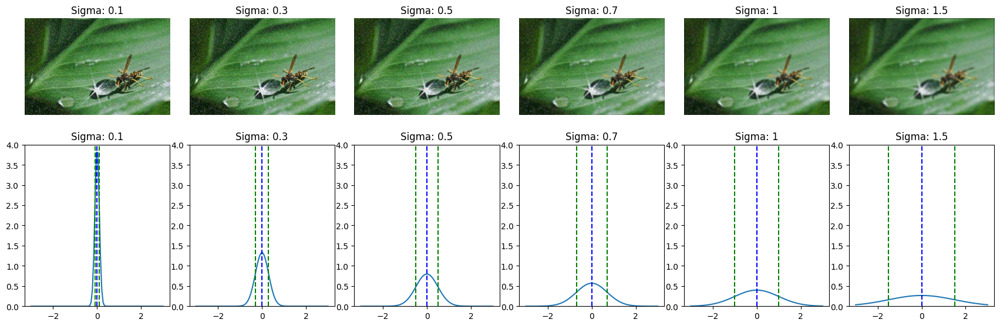

In [15]:
sigma_values = [0.1, 0.3, 0.5, 0.7, 1, 1.5]

fig, axes = plt.subplots(2, 6, figsize=(17, 6))

for idx, sigma in enumerate(sigma_values):
    mean = 0

    ax = axes[0, idx]
    ax.imshow(gaussFilter(img2, 7, sigma))
    ax.axis('off')
    ax.set_title(f'Sigma: {sigma}')

    ax = axes[1, idx]
    ax.plot(np.linspace(-3, 3, 100), [gaussian_1d(x, 0, sigma) for x in np.linspace(-3, 3, 100)])
    ax.axvline(mean, color='b', linestyle='--', label=f'Mean (μ)')
    ax.axvline(mean - sigma, color='g', linestyle='--', label=f'μ - σ')
    ax.axvline(mean + sigma, color='g', linestyle='--', label=f'μ + σ')
    ax.set_title(f'Sigma: {sigma}')
    ax.set_ylim(0, 4)

plt.tight_layout()
plt.show()

### Optimal Sigma for 7x7 Gaussian Filter

### <u>Gaussian Distribution</u>

A Gaussian (or normal) distribution is defined by the following formula:
$$
f(x) = \frac{1}{\sigma \sqrt{2\pi}} e^{-\frac{(x - \mu)^2}{2\sigma^2}}
$$

This formula is for 1D gaussian but similar argument can be made for 2D gaussian as well.

Now,

For a kernel size of $ 7 \times 7 $, the values for $ x $ and $ y $ range from $ -3 $ to $ +3 $. Since the Gaussian distribution is symmetrical around the mean, we need to find the $ \sigma $ that ensures most of the distribution's area is captured within this range.

### <u>Optimal $ \sigma $</u>

From the graph of the Gaussian distribution with different $ \sigma $ values, we observed that the best value of $ \sigma $ is $ 1 $. Since the kernel size is $ 7 \times 7 $, the range for both $ x $ and $ y $ is from $ -3 \sigma $ to $ +3 \sigma $.

$$
\text{Kernel range} = [-3\sigma, +3\sigma]
$$

When $ \sigma = 1 $, integrating the Gaussian function from $ -3\sigma $ to $ +3\sigma $ gives us:

$$
\int_{-3\sigma}^{3\sigma} f(x) \, dx = 0.997
$$

> This means that 99.7% of the area (since total aread under the gaussian curve = 1) under the curve is included within the kernel, making $ \sigma = 1 $ the optimal value for a $ 7 \times 7 $ Gaussian filter.

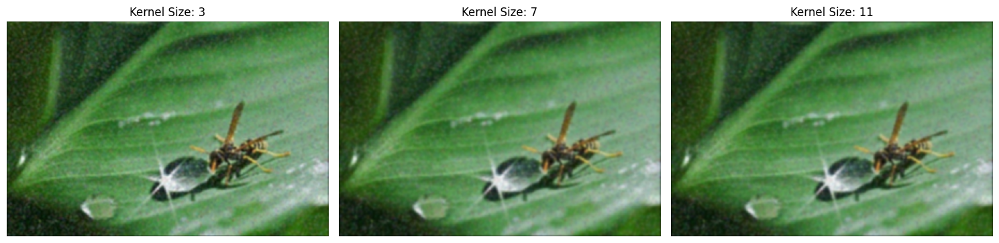

In [16]:
best_sigma = 1
k_values = [3, 7, 11]

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

for idx, k in enumerate(k_values):
    ax = axes[idx]
    ax.imshow(gaussFilter(img2, k, best_sigma))
    ax.axis('off')
    ax.set_title(f'Kernel Size: {k}')

plt.tight_layout()
plt.show()

When varying the kernel size $ k $ while keeping $\sigma$ at its optimal value, the following observations can be made:

1. **Large Kernel Sizes:** For kernel sizes larger than the optimal range defined by $ [-3\sigma, 3\sigma] $, the image output shows minimal changes. This is because most of the area under the Gaussian curve is already covered by the kernel when $ k $ exceeds this range. Outside of this range, the values of the Gaussian kernel are very close to zero and thus have a negligible impact on the pixel values. Consequently, increasing $ k $ beyond this optimal range does not significantly alter the blurring effect on the image.

2. **Kernel Size Close to the Optimal Range:** When the kernel size $ k $ is set close to the optimal range $ [-3\sigma, 3\sigma] $, the kernel effectively covers the significant portion of the Gaussian function. This balance ensures that the blurring effect is consistent with the desired level of smoothness, as the kernel captures most of the relevant area of the Gaussian distribution.

3. **Smaller Kernel Sizes:** Reducing the kernel size $ k $ below the optimal range decreases the area covered by the Gaussian function. As a result, less of the Gaussian distribution is utilized for blurring, which reduces the overall blurring effect. The image may appear sharper or less smooth compared to using a kernel size that closely matches the optimal range.

In [17]:
def bilateralFilter(img, k=7, sigma_s=1, sigma_r=1):
    # Defining distance kernel weights outside the function as they are constant
    distance_kernel_weight = np.zeros((k, k))
    for i in range(k):
        for j in range(k):
            distance_kernel_weight[i, j] = np.exp(-((i - k//2)**2 + (j - k//2)**2) / (2 * sigma_s**2))
    
    def bilateral(pixels=None, return_k=False):
        if return_k:
            return k
        center_pixel = pixels[k//2, k//2]
        intensity_kernel_weight = np.exp(-((pixels - center_pixel) ** 2) / (2 * sigma_r ** 2))
        final_weights = intensity_kernel_weight * distance_kernel_weight
        return np.sum(final_weights * pixels) / np.sum(final_weights)
    return conv2D(img, bilateral)

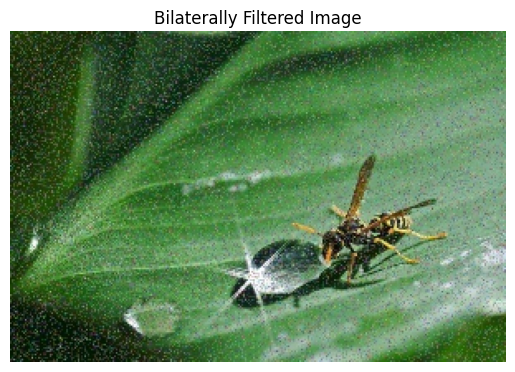

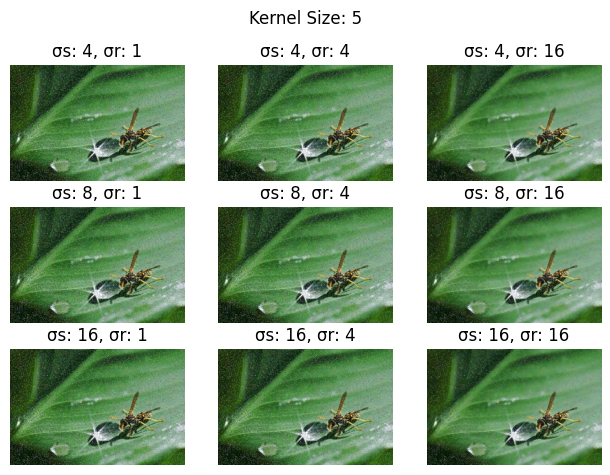

In [18]:
bilaterally_filtered_img = bilateralFilter(img2, 7, 4, 0.05)
plt.imshow(bilaterally_filtered_img)
plt.axis('off')
plt.title('Bilaterally Filtered Image')

k_values = [5]
sigma_s_values = [4, 8, 16]
sigma_r_values = [1, 4, 16]

for k in k_values:
    fig, axes = plt.subplots(3, 3)
    for s_idx, sigma_s in enumerate(sigma_s_values):
        for r_idx, sigma_r in enumerate(sigma_r_values):
            ax = axes[s_idx, r_idx]
            ax.imshow(bilateralFilter(img2, k, sigma_s, sigma_r))
            ax.axis('off')
            ax.set_title(f'σs: {sigma_s}, σr: {sigma_r}')
    fig.suptitle(f'Kernel Size: {k}')
    plt.tight_layout()
    plt.show()

> The Gaussian filter takes weighted average of nearby pixel values, with weights determined by a Gaussian distribution. It effectively reduces noise but also blurs edges, as it treats all nearby pixels equally regardless of their intensity differences. In contrast, the bilateral filter considers the spatial proximity of pixels, like the Gaussian filter, but also the intensity differences between pixels. Pixels with similar intensities are given more weight, resulting in reduced blurring of edges while still smoothing within regions of similar intensity.  Thus, Gaussian filtering leads to more uniform blurring across the image, while bilateral filtering retains sharp edges, making it more suitable for applications where edge preservation is important.

# Q3 Edge of Glory

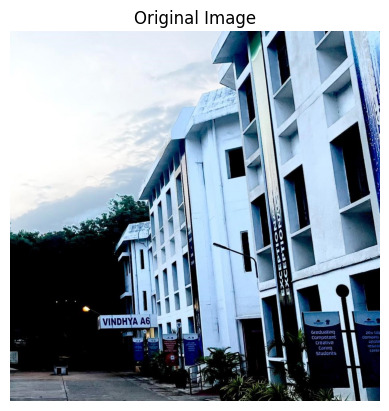

In [19]:
def sobelFilter(img):
    sobel_x = np.array([[-1, 0, 1], 
                        [-2, 0, 2], 
                        [-1, 0, 1]])
    sobel_y = np.array([[-1, -2, -1],
                        [0, 0, 0],
                        [1, 2, 1]])
    gradient_x = conv2D(img, sobel_x)
    gradient_y = conv2D(img, sobel_y)
    gradient_magnitude = np.sqrt(gradient_x ** 2 + gradient_y ** 2)
    return gradient_x, gradient_y, gradient_magnitude

def prewittFilter(img):
    G_x = np.array([[-1, 0, 1], 
                    [-1, 0, 1], 
                    [-1, 0, 1]])
    G_y = np.array([[-1, -1, -1],
                    [0, 0, 0],
                    [1, 1, 1]])
    gradient_x = conv2D(img, G_x)
    gradient_y = conv2D(img, G_y)
    gradient_magnitude = np.sqrt(gradient_x ** 2 + gradient_y ** 2)
    return gradient_x, gradient_y, gradient_magnitude

def robersFilter(img):
    G_x = np.array([[1, 0],
                    [0, -1]])
    G_y = np.array([[0, 1],
                    [-1, 0]])
    gradient_x = conv2D(img, G_x)
    gradient_y = conv2D(img, G_y)
    gradient_magnitude = np.sqrt(gradient_x ** 2 + gradient_y ** 2)
    return gradient_x, gradient_y, gradient_magnitude

img3 = read_img('../images/IMG3.jpeg')

plt.imshow(img3)
plt.axis('off')
plt.title('Original Image')
plt.show()

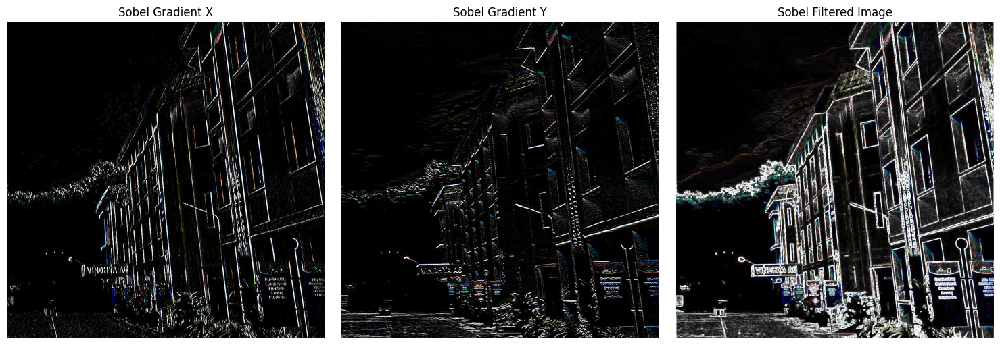

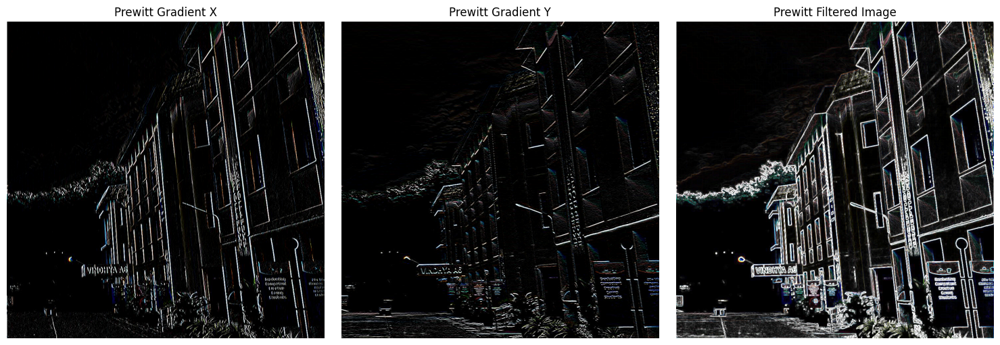

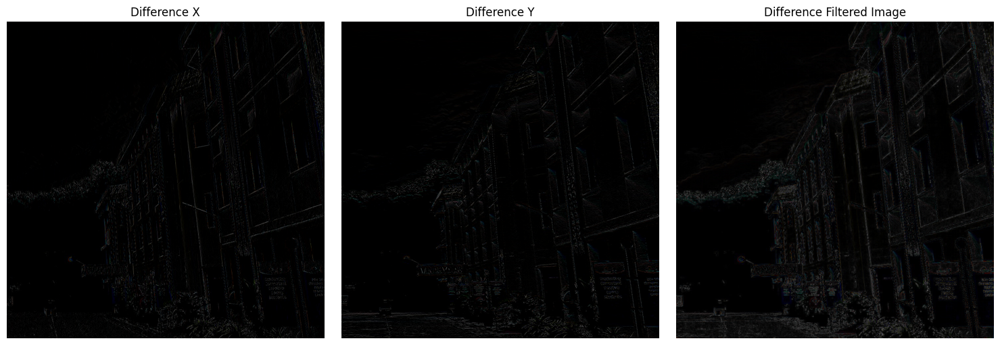

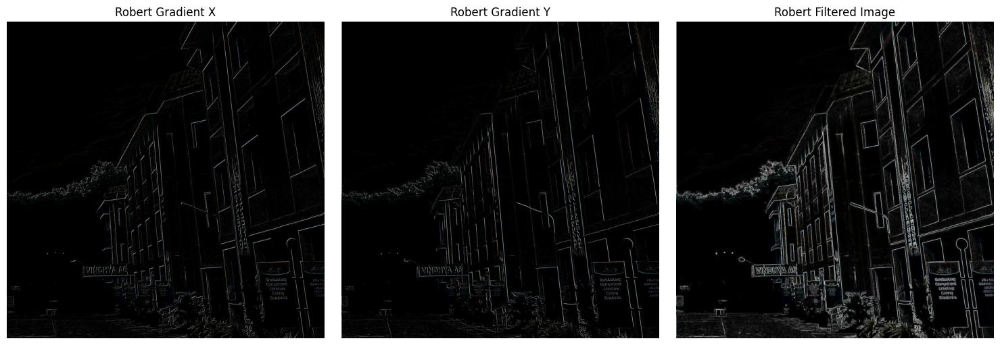

In [20]:
sobel_gradient_x, sobel_gradient_y, sobel_filtered_img = np.clip(np.int32(sobelFilter(img3)), 0, 255)
prewitt_gradient_x, prewitt_gradient_y, prewitt_filtered_img = np.clip(np.int32(prewittFilter(img3)), 0, 255)
robert_gradient_x, robert_gradient_y, robert_filtered_img = np.clip(np.int32(robersFilter(img3)), 0, 255)

fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(sobel_gradient_x)
ax[0].axis('off')
ax[0].set_title('Sobel Gradient X')
ax[1].imshow(sobel_gradient_y)
ax[1].axis('off')
ax[1].set_title('Sobel Gradient Y')
ax[2].imshow(sobel_filtered_img)
ax[2].axis('off')
ax[2].set_title('Sobel Filtered Image')
plt.tight_layout()
plt.show()

fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(prewitt_gradient_x)
ax[0].axis('off')
ax[0].set_title('Prewitt Gradient X')
ax[1].imshow(prewitt_gradient_y)
ax[1].axis('off')
ax[1].set_title('Prewitt Gradient Y')
ax[2].imshow(prewitt_filtered_img)
ax[2].axis('off')
ax[2].set_title('Prewitt Filtered Image')
plt.tight_layout()
plt.show()

fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(abs(prewitt_gradient_x - sobel_gradient_x))
ax[0].axis('off')
ax[0].set_title('Difference X')
ax[1].imshow(abs(prewitt_gradient_y - sobel_gradient_y))
ax[1].axis('off')
ax[1].set_title('Difference Y')
ax[2].imshow(abs(prewitt_filtered_img - sobel_filtered_img))
ax[2].axis('off')
ax[2].set_title('Difference Filtered Image')
plt.tight_layout()
plt.show()

fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(robert_gradient_x)
ax[0].axis('off')
ax[0].set_title('Robert Gradient X')
ax[1].imshow(robert_gradient_y)
ax[1].axis('off')
ax[1].set_title('Robert Gradient Y')
ax[2].imshow(robert_filtered_img)
ax[2].axis('off')
ax[2].set_title('Robert Filtered Image')
plt.tight_layout()
plt.show()

In [21]:
def laplacianFilter(img, k):
    # Assuming full connect laplacian filter
    kernel = np.ones((k, k)) * -1
    kernel[k//2, k//2] = k * k - 1
    return np.clip(np.int32(conv2D(img, kernel)), 0, 255)

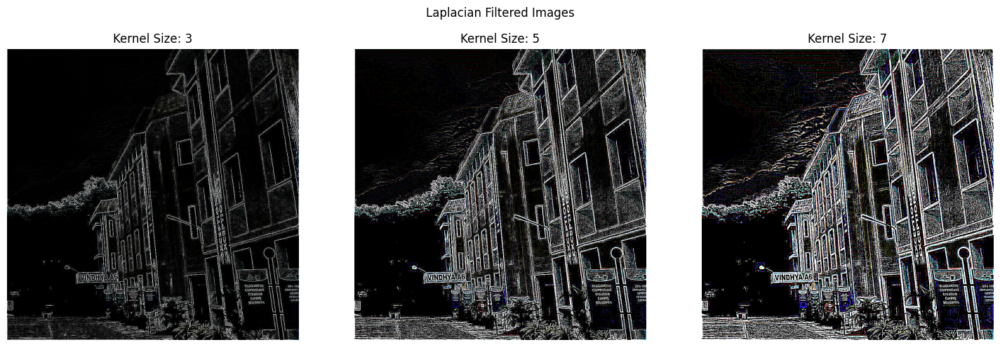

In [22]:
k_values = [3, 5, 7]

fig, axes = plt.subplots(1, len(k_values), figsize=(15, 5))

for idx, k in enumerate(k_values):
    laplace_filtered_img = laplacianFilter(img3, k)
    axes[idx].imshow(laplace_filtered_img)
    axes[idx].axis('off')
    axes[idx].set_title(f'Kernel Size: {k}')
fig.suptitle('Laplacian Filtered Images\n')
plt.tight_layout()
plt.show()

> By varying the kernel size, we observe that when the kernel is too small (e.g., \(k = 3\)), it struggles to detect edges effectively. On the other hand, a larger kernel (e.g., \(k = 7\)) increases sensitivity, causing noise to be detected as edges, resulting in a noisy output. Only at an optimal kernel size are edges clearly detected without excessive noise; however, some faint edges, such as the rooftop edges of Vindhya, may still go undetected.

> In images dominated by vertical edges, the Sobel and Prewitt filters show notable differences. Both compute intensity gradients in horizontal (x) and vertical (y) directions, but while their x-gradients are similar, their y-gradients differ significantly. This occurs because the Sobel filter gives more weight to pixels closer to the edge in the direction perpendicular to the gradient, while the Prewitt filter assigns equal weight to all neighboring pixels.

### Sobel Filter:
The Sobel filter detects edges by calculating intensity gradients in both horizontal and vertical directions with 3x3 kernels. Its smoothing effect makes it better suited for handling noise, especially for detecting prominent horizontal and vertical edges in images with gradual intensity changes.

### Prewitt Filter:
Similar to Sobel, the Prewitt filter uses 3x3 kernels for gradient detection but treats all neighboring pixels equally, making it less robust to noise. It is computationally efficient and effective for sharp edge detection but is more sensitive to noise than Sobel.

### Roberts Filter:
The Roberts filter uses smaller 2x2 kernels, making it sensitive to fine details and diagonal edges, particularly at 45° and 135° angles. It is ideal for detecting rapid intensity changes but is more prone to amplifying noise, making it best for clean images.

### Laplacian Filter:
The Laplacian filter detects edges in all directions by calculating the second derivative of intensity, making it isotropic and effective for identifying fine details and rapid changes. However, it is sensitive to noise and often used in combination with smoothing filters like Gaussian to mitigate this issue.

# Q4 Sharpen Up

In [23]:
def unsharpMask(img, k, sigma):
    gaussian_filtered_img = gaussFilter(img, k, sigma)
    unsharp_mask = img - gaussian_filtered_img
    sharpened_img = img + unsharp_mask
    return np.clip(np.int32(sharpened_img), 0, 255)

img4 = read_img('../images/IMG4.png')

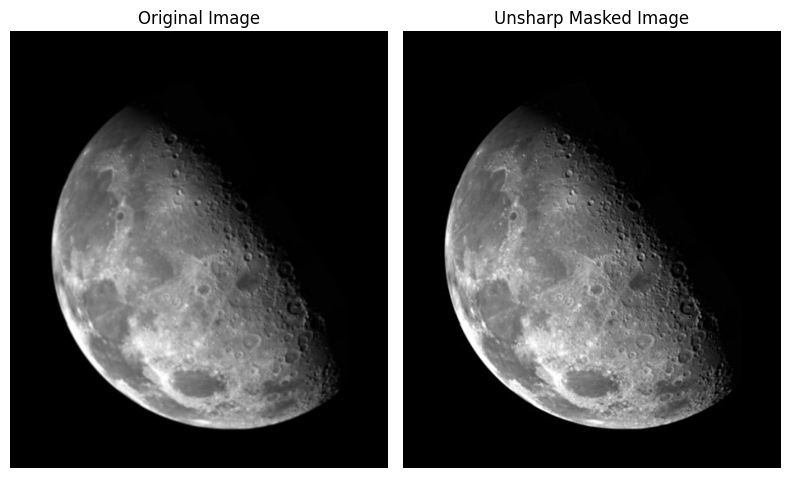

In [24]:
unsharp_masked_img = unsharpMask(img4, 7, 1)
fig, axes = plt.subplots(1, 2, figsize=(8, 5))
axes[0].imshow(img4)
axes[0].axis('off')
axes[0].set_title('Original Image')
axes[1].imshow(unsharp_masked_img)
axes[1].axis('off')
axes[1].set_title('Unsharp Masked Image')
plt.tight_layout()
plt.show()

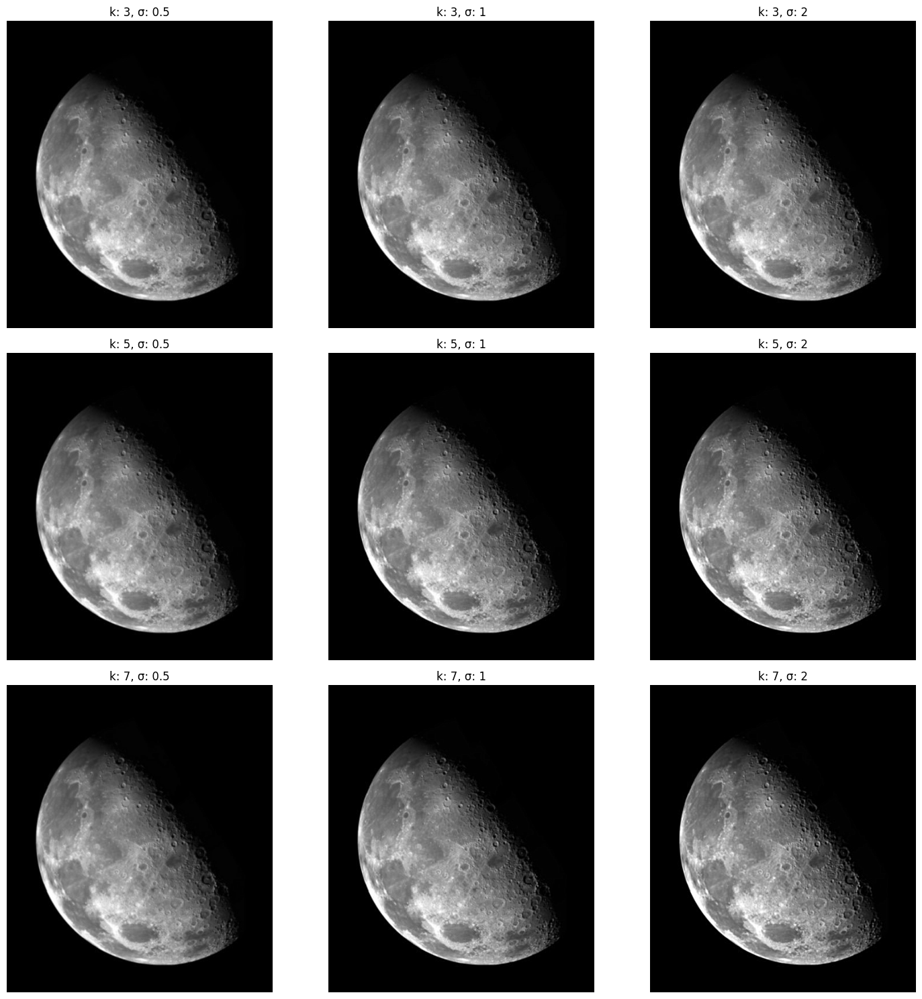

In [25]:
k_vals = [3, 5, 7]
sigma_vals = [0.5, 1, 2]

fig, axes = plt.subplots(3, 3, figsize=(15, 15))

for k_idx, k in enumerate(k_vals):
    for sigma_idx, sigma in enumerate(sigma_vals):
        sharpened_img = unsharpMask(img4, k, sigma)
        ax = axes[k_idx, sigma_idx]
        ax.imshow(sharpened_img)
        ax.axis('off')
        ax.set_title(f'k: {k}, σ: {sigma}')
    
plt.tight_layout()
plt.show()

In [26]:
def highBoostFilter(img, k=7, sigma=1, A=2):
    smoothed_img = gaussFilter(img, k, sigma)
    detail_img = img - smoothed_img
    sharpened_img = img + A * detail_img
    return np.clip(np.int32(sharpened_img), 0, 255)

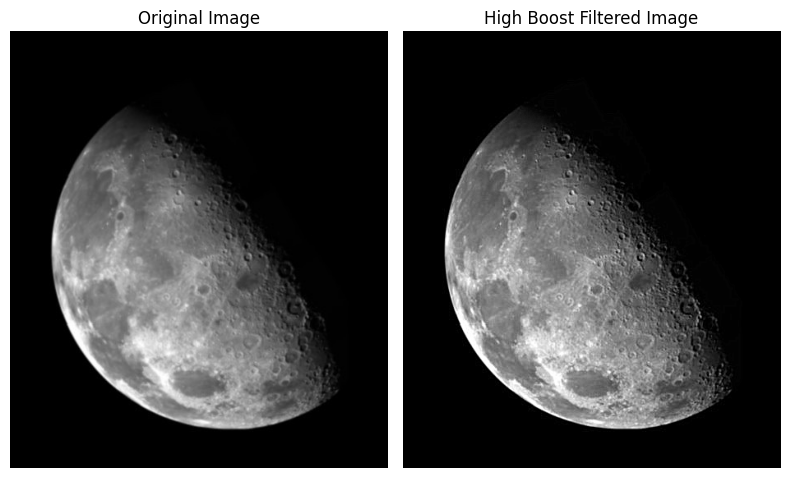

In [27]:
high_boost_filtered_img = highBoostFilter(img4, 7, 1, 2)
fig, axes = plt.subplots(1, 2, figsize=(8, 5))
axes[0].imshow(img4)
axes[0].axis('off')
axes[0].set_title('Original Image')
axes[1].imshow(high_boost_filtered_img)
axes[1].axis('off')
axes[1].set_title('High Boost Filtered Image')
plt.tight_layout()
plt.show()

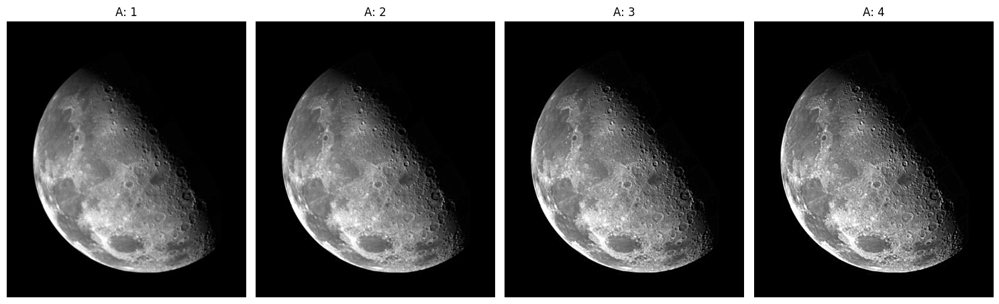

In [28]:
A_vals = [1, 2, 3, 4]

fig, axes = plt.subplots(1, len(A_vals), figsize=(15, 5))

for A_idx, A in enumerate(A_vals):
    high_boost_filtered_image = highBoostFilter(img4, 7, 1, A)
    ax = axes[A_idx]
    ax.imshow(high_boost_filtered_image)
    ax.axis('off')
    ax.set_title(f'A: {A}')

plt.tight_layout()
plt.show()

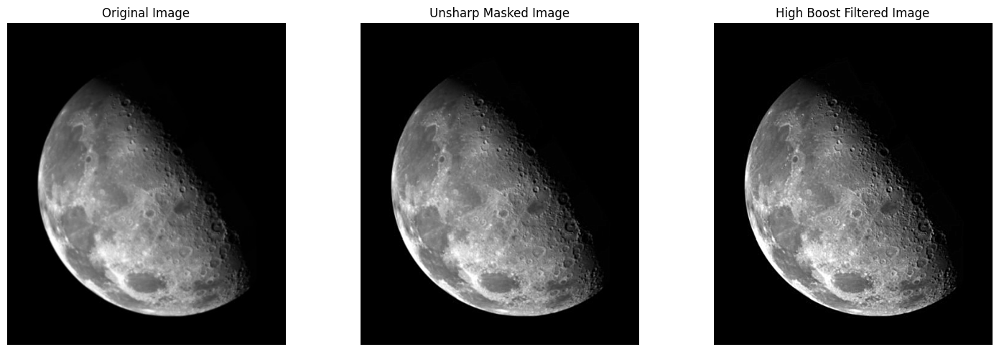

In [29]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(img4)
axes[0].axis('off')
axes[0].set_title('Original Image')
axes[1].imshow(unsharpMask(img4, 7, 1))
axes[1].axis('off')
axes[1].set_title('Unsharp Masked Image')
axes[2].imshow(highBoostFilter(img4, 7, 1, 2))
axes[2].axis('off')
axes[2].set_title('High Boost Filtered Image')
plt.tight_layout()
plt.show()

> Highboost filtering is effective for enhancing fine details in images. It works by amplifying high-frequency components while suppressing low-frequency elements, which accentuates subtle textures and edges. Additionally, by adding multiple copies of the detailed image, it increases the contribution of these fine details in the final output. This results in improved clarity and sharpness, making it especially useful for applications that require enhanced detail resolution.

# Q5 Rain Rain Go Away!

In [30]:
img5 = read_img('../images/IMG5.jpg')

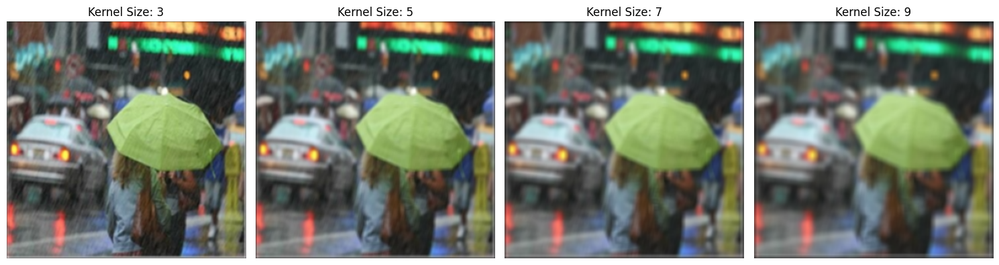

In [31]:
k_vals = [3, 5, 7, 9]
fig, axes = plt.subplots(1, 4, figsize=(15, 5))

# Applying Mean Filter
for k_idx, k in enumerate(k_vals):
    avg_img = meanFilter(img5, k)
    ax = axes[k_idx]
    ax.imshow(avg_img)
    ax.axis('off')
    ax.set_title(f'Kernel Size: {k}')
plt.tight_layout()
plt.show()

> We can see that the mean filter just averages out and blurs out all he colors so while the rain goes away the sharpness and distiction of overall image also goes away.

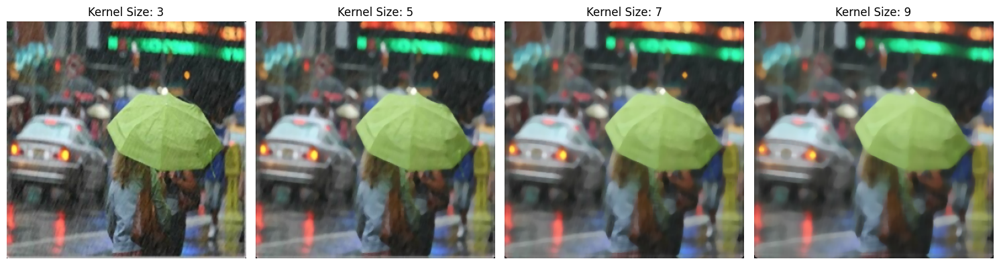

In [32]:
k_vals = [3, 5, 7, 9]
fig, axes = plt.subplots(1, 4, figsize=(15, 5))

# Applying Median Filter
for k_idx, k in enumerate(k_vals):
    median_img = medianFilter(img5, k)
    ax = axes[k_idx]
    ax.imshow(median_img)
    ax.axis('off')
    ax.set_title(f'Kernel Size: {k}')
plt.tight_layout()
plt.show()

> The median filter also helps in removing the rain drops but it makes the image more flat since it is reducing the number of colors in the image by just using the median pixel value for each convolution in each frame.

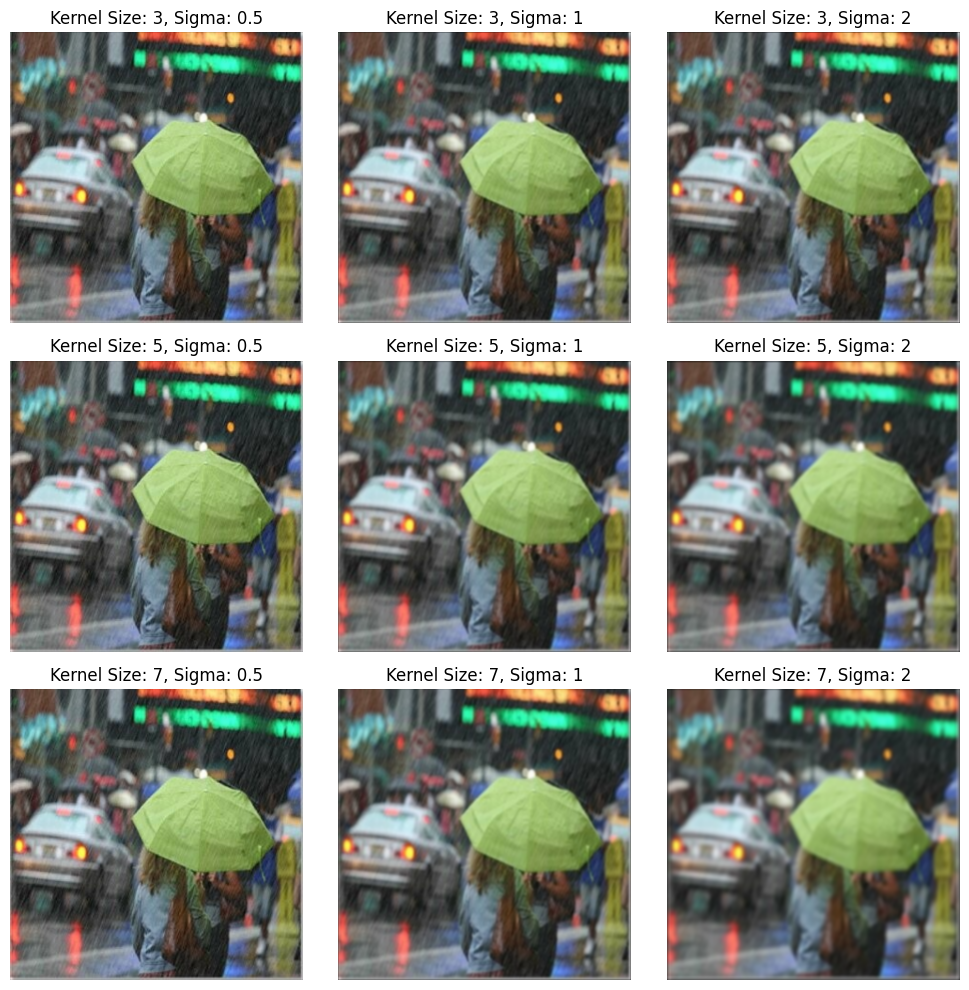

In [33]:
k_vals = [3, 5, 7]
sigma_vals = [0.5, 1, 2]
fig, axes = plt.subplots(3, 3, figsize=(10, 10))

# Applying Gaussian Filter
for k_idx, k in enumerate(k_vals):
    for sigma_idx, sigma in enumerate(sigma_vals):
        gauss_img = gaussFilter(img5, k, sigma)
        ax = axes[k_idx, sigma_idx]
        ax.imshow(gauss_img)
        ax.axis('off')
        ax.set_title(f'Kernel Size: {k}, Sigma: {sigma}')
plt.tight_layout()
plt.show()

> Increasing the sigma makes the gaussian more and more like applying a mean filter, and the kernel size does not have much visible change in case of removing the rain drops.

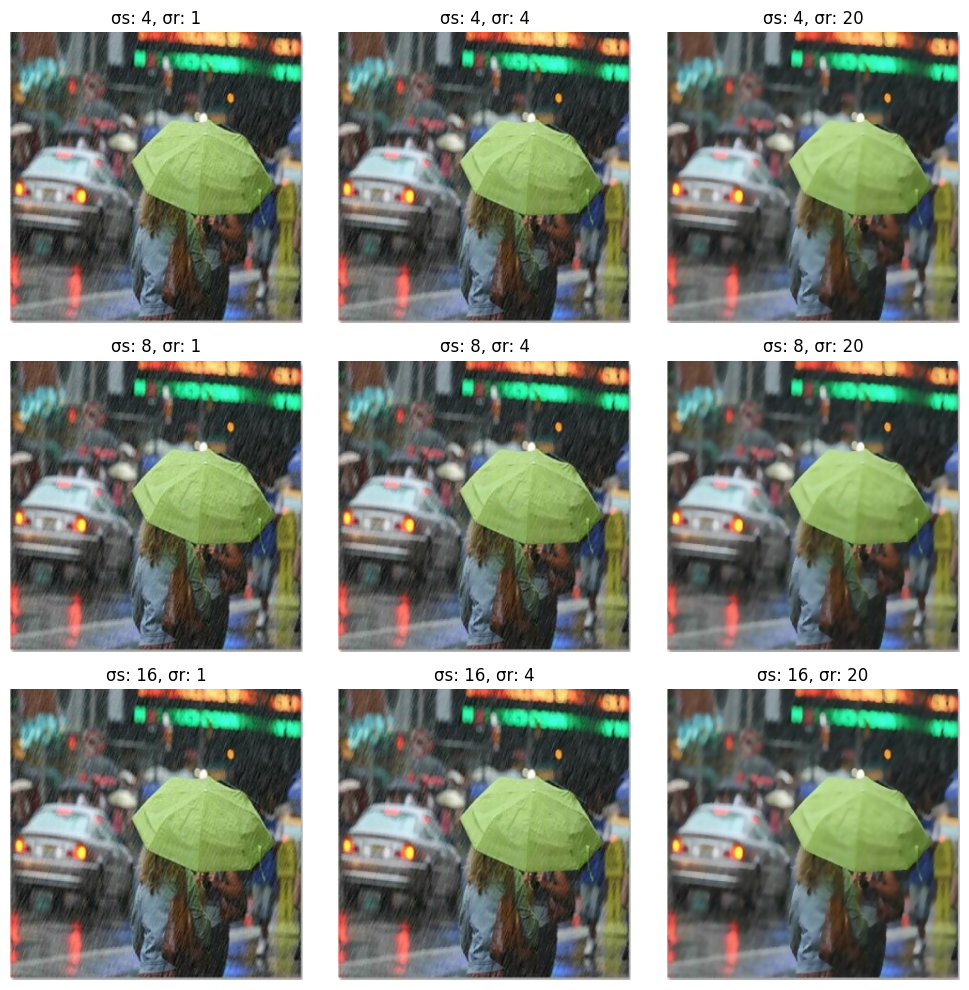

In [34]:
k = 5
sigma_s_values = [4, 8, 16]
sigma_r_values = [1, 4, 20]
fig, axes = plt.subplots(3, 3, figsize=(10, 10))

# Applying Bilateral Filter
for s_idx, sigma_s in enumerate(sigma_s_values):
    for r_idx, sigma_r in enumerate(sigma_r_values):
        bilateral_filtered_img = bilateralFilter(img5, k, sigma_s, sigma_r)
        ax = axes[s_idx, r_idx]
        ax.imshow(bilateral_filtered_img)
        ax.axis('off')
        ax.set_title(f'σs: {sigma_s}, σr: {sigma_r}')
plt.tight_layout()
plt.show()

> Clearly bilateral filter works best as they perform the work of both the mean filter and also less global than the gaussian filter - it tries to preserve edges and color transitions which makes the image look more cleaner.

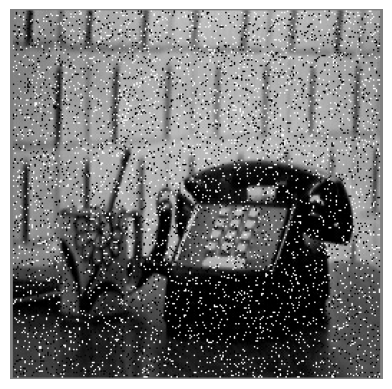

In [35]:
img6 = read_img("../images/IMG6.png")
plt.imshow(img6)
plt.axis('off')
plt.show()

The image has salt and pepper noise. And the best way to remove this kind of noise is median filter.

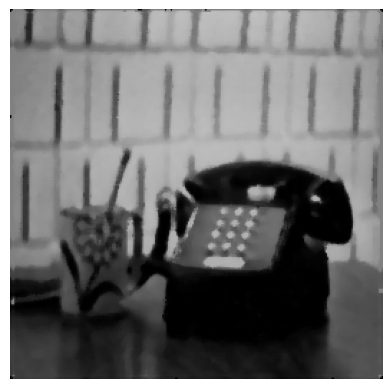

In [36]:
median_filtered_image = medianFilter(img6, 5)
plt.imshow(median_filtered_image)
plt.axis('off')
plt.show()

# Q6 Transform and Conquer

## 6a.1 Counting Coins

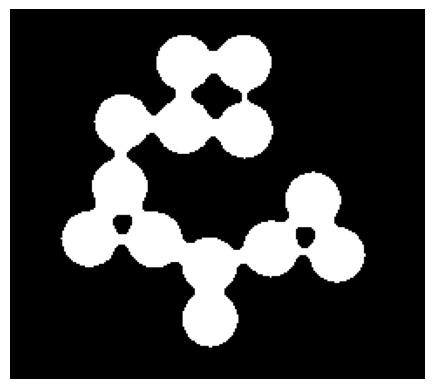

In [37]:
img7 = read_img("../images/IMG7.jpg", grayscale=True)
# Converting image to binary
img7 = np.where(img7 < 128, 0, 255)
plt.imshow(img7, cmap='gray')
plt.axis('off')
plt.show()

In [38]:
# We will use erosion here to separate each coin
def create_circular_kernel(k=5):
    kernel = np.zeros((k, k))
    center = k // 2
    radius = k // 2
    for i in range(k):
        for j in range(k):
            if (i - center) ** 2 + (j - center) ** 2 <= radius ** 2:
                kernel[i, j] = 1
    return kernel

def erode(img, k=5):
    circular_kernel = create_circular_kernel(k)
    def erosion(pixels=None, return_k=False):
        if return_k:
            return k
        sum_kernel = np.sum(circular_kernel) * 255
        sum_pixels = np.sum(circular_kernel * pixels)
        if sum_pixels == sum_kernel:
            return np.max(pixels)
        else:
            return np.min(pixels)
    return conv2D(img, erosion)

def dialate(img, k=5):
    circular_kernel = create_circular_kernel(k)
    def dialation(pixels=None, return_k=False):
        if return_k:
            return k
        sum_pixels = np.sum(circular_kernel * pixels)
        if sum_pixels > 0:
            return np.max(pixels)
        return np.min(pixels)
    return conv2D(img, dialation)

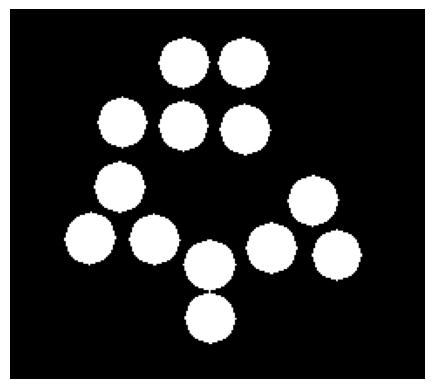

In [39]:
# Erode
times_erode = 3
disk_se_radius = 11
eroded_img = img7

for i in range(times_erode):
    eroded_img = erode(eroded_img, disk_se_radius)

# plt.imshow(eroded_img, cmap='gray')
# plt.axis('off')
# plt.show()

# Dialate
times_dialate = 2
disk_se_radius = 11
dialated_img = eroded_img

for i in range(times_dialate):
    dialated_img = dialate(dialated_img, disk_se_radius)

dialated_img_2 = dialate(dialated_img, 9)

plt.imshow(dialated_img_2, cmap='gray')
plt.axis('off')
plt.show()

## Signature Verification

In [40]:
def convert_to_inverted_binary(img_arr):
    # Used 200 as threshold as it was giving better binary visible image
    return np.where(img_arr <= 200, 1, 0)

## 6b.1

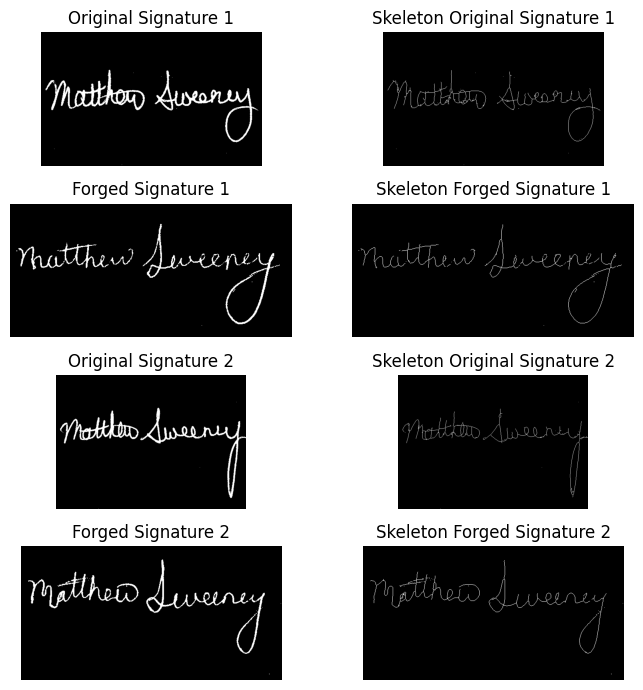

In [41]:
sig_1_org = convert_to_inverted_binary(read_img("../images/original_sig_1.png", grayscale=True))
sig_1_forge = convert_to_inverted_binary(read_img("../images/forged_sig_1.png", grayscale=True))
sig_2_org = convert_to_inverted_binary(read_img("../images/original_sig_2.png", grayscale=True))
sig_2_forge = convert_to_inverted_binary(read_img("../images/forged_sig_2.png", grayscale=True))

fig, ax = plt.subplots(4, 2, figsize=(7, 7))
ax[0, 0].imshow(sig_1_org, cmap='gray')
ax[0, 0].axis('off')
ax[0, 0].set_title('Original Signature 1')

ax[0, 1].imshow(skeletonize(sig_1_org), cmap='gray')
ax[0, 1].axis('off')
ax[0, 1].set_title('Skeleton Original Signature 1')

ax[1, 0].imshow(sig_1_forge, cmap='gray')
ax[1, 0].axis('off')
ax[1, 0].set_title('Forged Signature 1')

ax[1, 1].imshow(skeletonize(sig_1_forge), cmap='gray')
ax[1, 1].axis('off')
ax[1, 1].set_title('Skeleton Forged Signature 1')

ax[2, 0].imshow(sig_2_org, cmap='gray')
ax[2, 0].axis('off')
ax[2, 0].set_title('Original Signature 2')

ax[2, 1].imshow(skeletonize(sig_2_org), cmap='gray')
ax[2, 1].axis('off')
ax[2, 1].set_title('Skeleton Original Signature 2')

ax[3, 0].imshow(sig_2_forge, cmap='gray')
ax[3, 0].axis('off')
ax[3, 0].set_title('Forged Signature 2')

ax[3, 1].imshow(skeletonize(sig_2_forge), cmap='gray')
ax[3, 1].axis('off')
ax[3, 1].set_title('Skeleton Forged Signature 2')

plt.tight_layout()
plt.show()

# 7 Body Scan Enhancement

In [42]:
def get_histogram(img_arr):
    '''
        Note if the image passed in has only 1 channel (grayscale), it will return the histogram for that 1 channel
        But if the image has 3 channels (RGB), it will return the sum histogram of all 3 channels
    '''
    hist = np.zeros(256)
    for i in range(256):
        hist[i] = np.sum(img_arr == i)
    return hist

def histequalize(img_arr):
    hist = get_histogram(img_arr)
    cdf = np.cumsum(hist)
    min_val = np.min(cdf)
    max_val = np.max(cdf)
    normalised_cdf = np.int32(((cdf - min_val) / (max_val - min_val)) * 255)
    equalised_img = normalised_cdf[img_arr]
    return equalised_img

def minFilter(img_arr, k=5):
    def min_pixel(pixels=None, return_k=False):
        if return_k:
            return k
        if np.mean(pixels) > 5:
            return pixels[k//2, k//2]
        else:
            return np.min(pixels)
    return conv2D(img_arr, min_pixel)

In [43]:
def homomorphicFilter(img, gammaL=0.5, gammaH=2.0, c=1.0, D0=30):
    img = img / 255.0  # Normalize image
    log_img = np.log1p(img)

    fft_img = np.fft.fft2(log_img)
    fft_img_shift = np.fft.fftshift(fft_img)  # Shift zero frequency to center

    rows, cols = img.shape
    u = np.arange(rows)
    v = np.arange(cols)
    U, V = np.meshgrid(u - rows//2, v - cols//2, sparse=True, indexing='ij')
    D_uv = np.sqrt(U**2 + V**2)
    
    # Homomorphic filter function
    H_uv = (gammaH - gammaL) * (1 - np.exp(-c * (D_uv**2) / (D0**2))) + gammaL

    filtered_fft_img = fft_img_shift * H_uv

    filtered_fft_img_shift = np.fft.ifftshift(filtered_fft_img)
    filtered_log_img = np.fft.ifft2(filtered_fft_img_shift)
    filtered_log_img = np.real(filtered_log_img)  # Take the real part
    filtered_img = np.expm1(filtered_log_img)
    
    # Rescaling it to 0 to 255 before returning
    filtered_img = np.int32(np.clip(filtered_img, 0, 1) * 255)

    return filtered_img

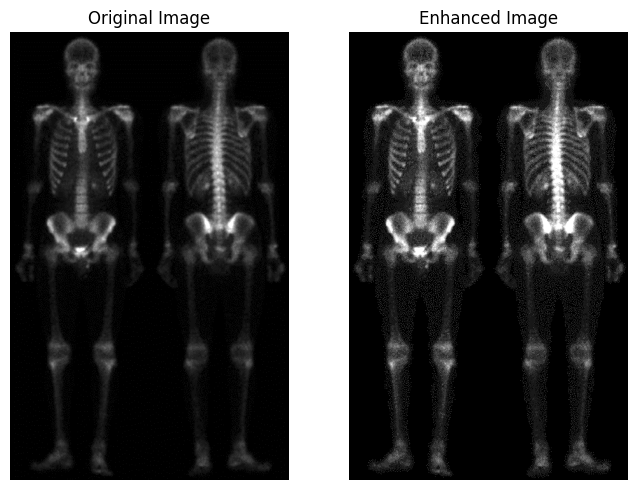

In [44]:
body_scan_img = read_img("../images/IMG8.png", grayscale=True)
filtered_img = homomorphicFilter(body_scan_img)           # Typical for medical image enhancement (aka magic light filter)
filtered_img = body_scan_img * 1.25                       # Brightening the pixels
filtered_img = np.clip(filtered_img, 0, 255)              # Clipping
filtered_img = bilateralFilter(filtered_img)              # Bilateral filter to enhance edges and smooth out the image
filtered_img = unsharpMask(filtered_img, k=7, sigma=1)    # Sharpening the image
filtered_img = minFilter(filtered_img, k=11)
filtered_img = bilateralFilter(filtered_img, k=15, sigma_r=0.5, sigma_s=1) # Easing out the noise
filtered_img = filtered_img * 1.25                        # Brightening the image
filtered_img = np.clip(filtered_img, 0, 255)              # Clipping

mask = (filtered_img > 55) & (filtered_img < 60)
filtered_img[mask] *= 1.5

filtered_img = bilateralFilter(filtered_img, k=7, sigma_r=0.5, sigma_s=1) # Easing out the noise

filtered_img = np.clip(filtered_img, 0, 255)              # Clipping

fig, axes = plt.subplots(1, 2, figsize=(7, 5))

axes[0].axis("off")
axes[0].imshow(body_scan_img, cmap='gray')
axes[0].set_title('Original Image')

axes[1].axis("off")

axes[1].imshow(filtered_img, cmap='gray')
axes[1].set_title('Enhanced Image')

plt.tight_layout()
plt.show()

> Here I have first applied the homomorphic filter (aka magic light filter), this filter is generally used in medical imaging as it enhances the features of the medical imagery, after that applied the technique of histogram equalisation to increase the overall brightness of the image and 

# 8 You Can't See Me

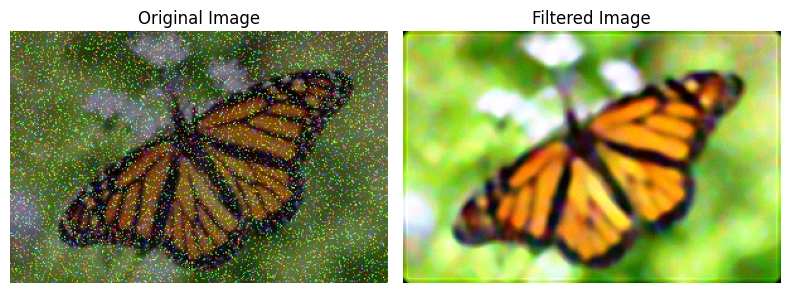

In [45]:
img9 = read_img("../images/IMG9.jpg")

# Applying Median Filter to each channel separately because we can see R, G, B pepper salt noise
R, G, B = img9[:, :, 0], img9[:, :, 1], img9[:, :, 2]
R_filtered = medianFilter(R, 9)
G_filtered = medianFilter(G, 9)
B_filtered = medianFilter(B, 9)
filtered_img9 = np.stack([R_filtered, G_filtered, B_filtered], axis=-1) # Stacking the channels back to get the image
filtered_img9 = gaussFilter(filtered_img9, 7, 2)        # Smoothing the image to make it more even
filtered_img9 = histequalize(filtered_img9)             # Equalizing the histogram to brighten the image
filtered_img9 = highBoostFilter(filtered_img9, 5, 1, 5) # Sharpening the image

fig, axes = plt.subplots(1, 2, figsize=(8, 3))

axes[0].axis("off")
axes[0].imshow(img9, cmap="gray")
axes[0].set_title("Original Image")

axes[1].axis('off')
axes[1].imshow(filtered_img9, cmap="gray")
axes[1].set_title("Filtered Image")

plt.tight_layout()
plt.show()